# Logistic Regression Baseline
In this notebook we will test the Logistic Regression model given by Andrew y Cui's 
Senior Thesis

## Data Import
Using data from Retrosheet and the Lahman database from 2001-2019

Stats we need: 
- Team hitting: OBP, ISO
- Team starting pitching: FIP, WHIP, K/9, HR/9, K/BB

In [1]:
import os
import pandas as pd

In [2]:
lahman_pitcher_path = '../data/lahman/core/Pitching.csv'
cFIP_path = '../data/lahman/core/cFIP.csv'
cFIP_df = pd.read_csv(cFIP_path)
pitcher_df = pd.read_csv(lahman_pitcher_path)
print(pitcher_df.columns)

pitcher_df['yearID'] = pd.to_datetime(pitcher_df['yearID'], format="%Y")
pitcher_df = pitcher_df.loc[pitcher_df["yearID"]>'2000']
pitcher_df = pitcher_df.loc[pitcher_df["yearID"]<'2020']
pitcher_df = pitcher_df.loc[pitcher_df["GS"]>12]


pitcher_df["WHIP"] = (pitcher_df["H"] + pitcher_df["BB"]) / (pitcher_df["IPouts"]/3)
pitcher_df["K/9"] = (pitcher_df["SO"]) / (pitcher_df["IPouts"]/9)
pitcher_df["HR/9"] = (pitcher_df["HR"]) / (pitcher_df["IPouts"]/9)
pitcher_df["K/BB"] = (pitcher_df["SO"]) / pitcher_df["BB"]


Index(['playerID', 'yearID', 'stint', 'teamID', 'lgID', 'W', 'L', 'G', 'GS',
       'CG', 'SHO', 'SV', 'IPouts', 'H', 'ER', 'HR', 'BB', 'SO', 'BAOpp',
       'ERA', 'IBB', 'WP', 'HBP', 'BK', 'BFP', 'GF', 'R', 'SH', 'SF', 'GIDP'],
      dtype='object')


In [3]:
from datetime import timedelta
cFIP_path = '../data/lahman/core/cFIP.csv'
cFIP_df = pd.read_csv(cFIP_path)
cFIP_df['Season'] = pd.to_datetime(cFIP_df['Season'], format="%Y")
cFIP_df = cFIP_df.loc[cFIP_df["Season"]>'2000']
cFIP_df = cFIP_df.loc[cFIP_df["Season"]<'2020']
cFIP_df = cFIP_df.rename(columns={"Season": "yearID"})

pitcher_df = pitcher_df.merge(cFIP_df, how="left", on="yearID")

pitcher_df["FIP"] = ((13 * pitcher_df["HR"]) + (3 * (pitcher_df["BB"] + pitcher_df["HBP"])) - (2 * pitcher_df["SO"])) / pitcher_df["IPouts"]/3 + pitcher_df["cFIP"]
pitcher_df["yearID"] = pitcher_df["yearID"] + timedelta(days=85)
pitcher_stats = ["playerID", "yearID", "FIP", "WHIP", "K/9", "HR/9", "K/BB"]
pitcher_df = pitcher_df[pitcher_stats]

print(pitcher_df)

       playerID     yearID       FIP      WHIP       K/9      HR/9      K/BB
0     abbotpa01 2001-03-27  3.266451  1.423313  2.171779  0.386503  1.356322
1     acevejo01 2001-03-27  3.275852  1.406250  2.125000  0.531250  2.000000
2     adamste01 2001-03-27  3.053008  1.358717  2.543086  0.162325  2.611111
3     anderbr02 2001-03-27  3.305667  1.395000  1.237500  0.562500  1.833333
4     anderji02 2001-03-27  3.210012  1.526656  1.294023  0.218094  1.072289
...         ...        ...       ...       ...       ...       ...       ...
3046  yamamjo01 2019-03-27  3.358068  1.144068  3.127119  0.419492  2.277778
3047  yarbrry01 2019-03-27  3.251647  0.995294  2.477647  0.317647  5.850000
3048   ynoaga01 2019-03-27  3.545325  1.373494  1.816265  0.786145  2.576923
3049  youngal01 2019-03-27  3.391333  1.188000  2.556000  0.504000  2.629630
3050  zimmejo02 2019-03-27  3.388603  1.517857  2.196429  0.508929  3.280000

[3051 rows x 7 columns]


In [4]:
# We get a mapping from retrosheet to lahmanID
people_path = '../data/lahman/core/People.csv'
people_map = {}
with open(people_path) as f: 
    for line in f: 
        line = line[:-1]
        line = line.split(',')
        if line[0] == 'playerID':
            continue
        people_map[line[-2]] = line[0]

In [5]:
import datetime
from statistics import mean
import numpy as np


class Game:
    def __init__(self, game_log, running_obs, running_iso, pitcher_df):
        self.date = datetime.datetime.strptime(str(game_log[0]), '%Y%m%d')
        self.home_team = game_log[6]
        self.visiting_team = game_log[3]
        
        self.running_obs = running_obs
        self.running_iso = running_iso

        self.usuable = True
        self.valid(game_log)
        if not self.usuable: 
            return 
        self.home_iso = mean(running_iso[self.home_team][1:])
        self.home_obs = mean(running_obs[self.home_team][1:])
        self.visiting_iso = mean(running_iso[self.visiting_team][1:])
        self.visiting_obs = mean(running_obs[self.visiting_team][1:])

        self.visiting_sp = people_map[game_log[101]]
        self.home_sp = people_map[game_log[103]]
        self.visiting_stats = pitcher_df.loc[
            (pitcher_df["playerID"] == self.visiting_sp) & 
            (pitcher_df["yearID"] < self.date)
            ].iloc[0]
            
        self.home_stats = pitcher_df.loc[
            (pitcher_df["playerID"] == self.home_sp) & 
            (pitcher_df["yearID"] < self.date)
            ].iloc[0]
        self.home_stats = self.home_stats[pitcher_stats].to_numpy()[2:]
        self.visiting_stats = self.visiting_stats[pitcher_stats].to_numpy()[2:]
        
        if not len(self.visiting_stats) or not len(self.home_stats): 
            self.usuable = False
        
        scores = [game_log[9], game_log[10]]
        # 0 indicates visiting team won. 1 indicates home team won
        self.winner = scores.index(max(scores))
    
    def valid(self, game_log): 
        self.usuable = True
        if self.home_team not in self.running_obs or self.visiting_team not in self.running_obs: 
            self.usuable = False
        elif self.running_iso[self.home_team][0] < len(self.running_iso[self.home_team]) - 1:
            self.usuable = False
        elif self.running_iso[self.visiting_team][0] < len(self.running_iso[self.visiting_team]) - 1: 
            self.usuable = False
        elif game_log[101] not in people_map or game_log[103] not in people_map:
            self.usuable = False
        elif game_log[13] != "" or game_log[14] != "" or game_log[15] != "": 
            self.usuable = False
    
    def to_matrix(self): 
        
        home_stats = np.array([[self.home_iso, self.home_obs, *self.home_stats]])
        
        away_stats = np.array([[self.visiting_iso, self.visiting_obs, *self.visiting_stats]])
        stats = (home_stats - away_stats) / home_stats * 100
        target = np.array([[self.winner]])
        return stats, target
        


In [6]:
def update_running(game_log, running_obs, running_iso, window=10): 
    home_team = game_log[6]
    visiting_team = game_log[3]
    if home_team not in running_obs: 
        running_obs[home_team] = [0]*(window + 1)
        running_iso[home_team] = [0]*(window + 1)
    if visiting_team not in running_obs: 
        running_obs[visiting_team] = [0]*(window + 1)
        running_iso[visiting_team] = [0]*(window + 1)
    
    h_idx = (running_obs[home_team][0] % window) + 1
    v_idx = (running_obs[visiting_team][0] % window) + 1

    obs_visit = (game_log[22] + game_log[30] + game_log[29]) / (game_log[21] + game_log[30] + game_log[29] + game_log[28])
    running_obs[visiting_team][v_idx] = obs_visit
    obs_home = (game_log[50] + game_log[58] + game_log[57]) / (game_log[49] + game_log[58] + game_log[57] + game_log[56])
    running_obs[home_team][h_idx] = obs_home

    iso_visit = (game_log[23] + 2*game_log[24] + 3*game_log[25]) / game_log[21]
    running_iso[visiting_team][v_idx] = iso_visit
    iso_home = (game_log[51] + 2*game_log[52] + 3*game_log[53]) / game_log[49]
    running_iso[home_team][h_idx] = iso_home

    running_obs[home_team][0] += 1
    running_obs[visiting_team][0] += 1
    running_iso[home_team][0] += 1
    running_iso[visiting_team][0] += 1
    



In [7]:
from pprint import pprint
from time import time
game_logs_path = '../data/game_logs/GL2001-2019.TXT'

running_obs = {}
running_iso = {}
window = 7
games = []
num_games = sum(1 for line in open(game_logs_path))
start = time()
with open(game_logs_path) as f: 
    iter = 0
    for line in f: 
        iter +=1
        line = line[:-1]
        line = line.split(',')
        for idx in range(len(line)): 
            line[idx] = line[idx].strip("\"")
            try: 
                line[idx] = int(line[idx])
            except: 
                pass
        try:
            game = Game(line, running_obs, running_iso, pitcher_df)
            update_running(line, running_obs, running_iso, window=window)
            prop = iter/num_games
            now = time()
            tr = timedelta(seconds=round((now-start)*(num_games-iter)/iter))
            print(f"percent complete: {round(prop*100,3)}%, time left:{tr}")
            if not game.usuable: 
                continue
            games.append(game)
        except: 
            pass

percent complete: 0.002%, time left:0:00:37
percent complete: 0.004%, time left:0:00:25
percent complete: 0.006%, time left:0:00:19
percent complete: 0.009%, time left:0:00:16
percent complete: 0.011%, time left:0:00:14
percent complete: 0.013%, time left:0:00:13
percent complete: 0.015%, time left:0:00:12
percent complete: 0.017%, time left:0:00:12
percent complete: 0.019%, time left:0:00:12
percent complete: 0.022%, time left:0:00:12
percent complete: 0.024%, time left:0:00:11
percent complete: 0.026%, time left:0:00:11
percent complete: 0.028%, time left:0:00:10
percent complete: 0.03%, time left:0:00:10
percent complete: 0.032%, time left:0:00:10
percent complete: 0.035%, time left:0:00:10
percent complete: 0.037%, time left:0:00:10
percent complete: 0.039%, time left:0:00:10
percent complete: 0.041%, time left:0:00:10
percent complete: 0.043%, time left:0:00:09
percent complete: 0.045%, time left:0:00:09
percent complete: 0.048%, time left:0:00:09
percent complete: 0.05%, time lef

In [8]:
train_X = None
train_y = None

cuttoff_date = datetime.datetime.strptime("2015-03-30", '%Y-%m-%d')
test_X = None
test_y = None

for game in games: 
    try: 
        x, y = game.to_matrix()
    except: 
        continue
    if game.date < cuttoff_date: 
        
        if train_X is None: 
            
            train_X, train_y = x,y
        else: 
            train_X = np.concatenate((train_X, x), axis=0)
            train_y = np.concatenate((train_y, y), axis=0)
    else: 
        if test_X is None: 
            test_X, test_y = x,y
        else: 
            test_X = np.concatenate((test_X, x), axis=0)
            test_y = np.concatenate((test_y, y), axis=0)

In [9]:
mask_nan = ~np.isnan(train_X).any(axis=1)
mask_inf = ~np.isinf(train_X).any(axis=1)
mask = mask_nan & mask_inf

train_X = train_X[mask, :]
train_y = train_y[mask, :]

mask_nan = ~np.isnan(test_X).any(axis=1)
mask_inf = ~np.isinf(test_X).any(axis=1)
mask = mask_nan & mask_inf
test_X = test_X[mask, :]
test_y = test_y[mask, :]

train_X_temp = np.nan_to_num(train_X)
test_X_temp = np.nan_to_num(test_X)

In [10]:
df = pd.DataFrame(train_X_temp, columns=["ISO", "OBP", "FIP", "WHIP", "K/9", "HR/9", "K/BB"])
print(df.describe())

                ISO           OBP           FIP          WHIP           K/9  \
count  2.834400e+04  28344.000000  28344.000000  28344.000000  28344.000000   
mean  -5.929460e+06     -1.470125     -0.115669     -1.685547     -6.162597   
std    4.062835e+08     15.433598      4.513640     18.289748     37.978331   
min   -4.027690e+10   -127.377401    -20.287163    -85.748961   -293.925378   
25%   -3.177243e+01    -10.945063     -3.067517    -12.882506    -25.907950   
50%   -1.930419e-01     -0.472016      0.003880     -0.080584      0.016973   
75%    2.327340e+01      9.392663      2.911383     11.449290     20.304282   
max    1.000000e+02     46.906699     17.957692     49.075414     75.556306   

               HR/9          K/BB  
count  28344.000000  28344.000000  
mean     -12.976922    -14.499446  
std       60.691675     65.531573  
min     -707.433217   -779.790823  
25%      -37.806413    -39.411765  
50%       -0.284925      0.283773  
75%       27.129674     27.958018  


Alert! from version 0.1.41, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
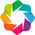

Shape of your Data Set loaded: (28344, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 28


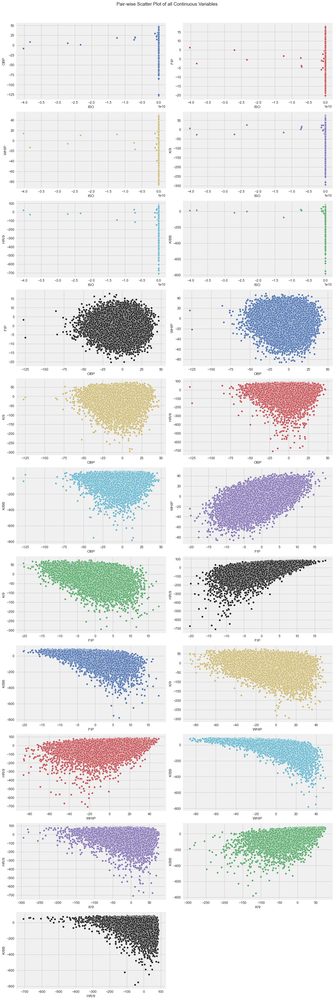

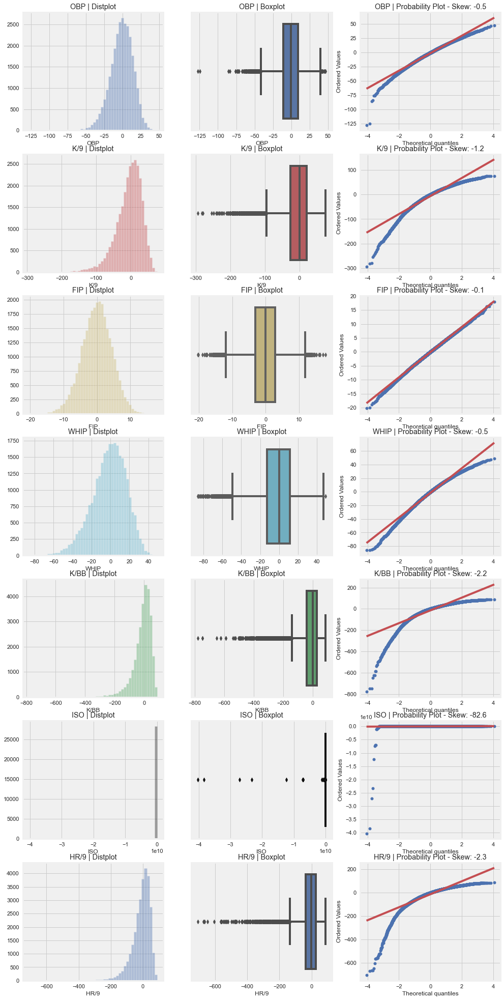

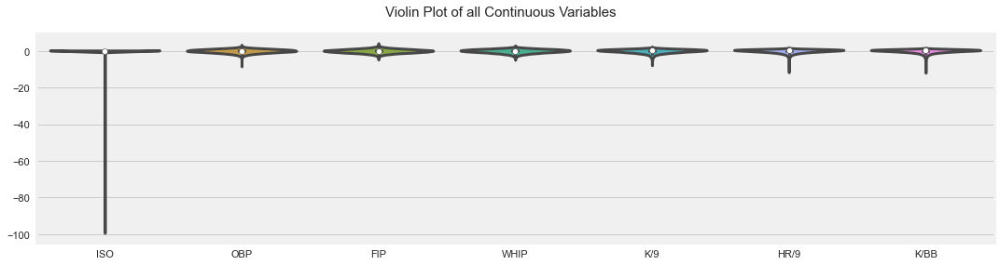

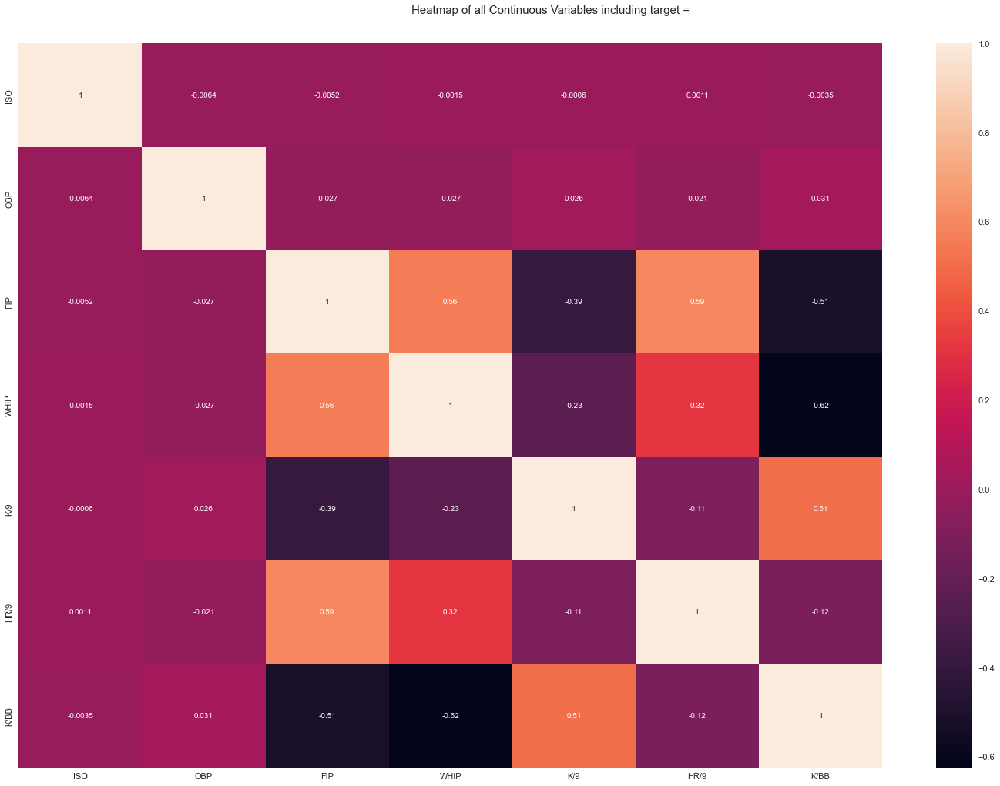

No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz = 10 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [11]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
dft = AV.AutoViz(
    filename="",
    dfte=df,
    lowess=False,
    verbose=0,
    max_rows_analyzed=150000,
    max_cols_analyzed=30
)




In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(train_X)
train_X = scaler.transform(train_X_temp)
test_X = scaler.transform(test_X_temp)

In [13]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=.75, max_iter=10000, C=.01, tol=1e-10)
model.fit(train_X, train_y)

LogisticRegression(C=0.01, l1_ratio=0.75, max_iter=10000, penalty='elasticnet',
                   solver='saga', tol=1e-10)

In [14]:
from sklearn.metrics import brier_score_loss, zero_one_loss
probs = model.predict_proba(train_X)
pred = model.predict(train_X)

brier = brier_score_loss(train_y, probs[:, 1])
accuracy = np.mean(pred == train_y)

print(f"train brier loss {round(brier,3)}")
print(f"train accuracy {round(accuracy*100,3)}%")

probs = model.predict_proba(test_X)
pred = model.predict(test_X)

brier = brier_score_loss(test_y, probs[:, 1])
accuracy = np.mean(pred == test_y)
print(f"test brier loss {round(brier,3)}")
print(f"test accuracy {round(accuracy*100,3)}%")

print(f"base line accuracy {round(np.mean(train_y)*100, 3)}%")


train brier loss 0.246
train accuracy 52.786%
test brier loss 0.248
test accuracy 52.586%
base line accuracy 54.135%
